In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### 파일 불러오기

In [2]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import tensorflow as tf

# 이미지 파일 경로
image_dir = '/content/drive/MyDrive/images'


input_img_paths = sorted([os.path.join(image_dir, fname)
                          for fname in os.listdir(image_dir)
                          if not (('fuse' in fname) or ('save' in fname))])
target_img_paths = sorted([os.path.join(image_dir, fname)
                           for fname in os.listdir(image_dir)
                           if 'fuse' in fname])

# 입력 데이터 개수 확인
print(len(input_img_paths))

# 타겟 데이터 개수 확인
print(len(target_img_paths))

200
200


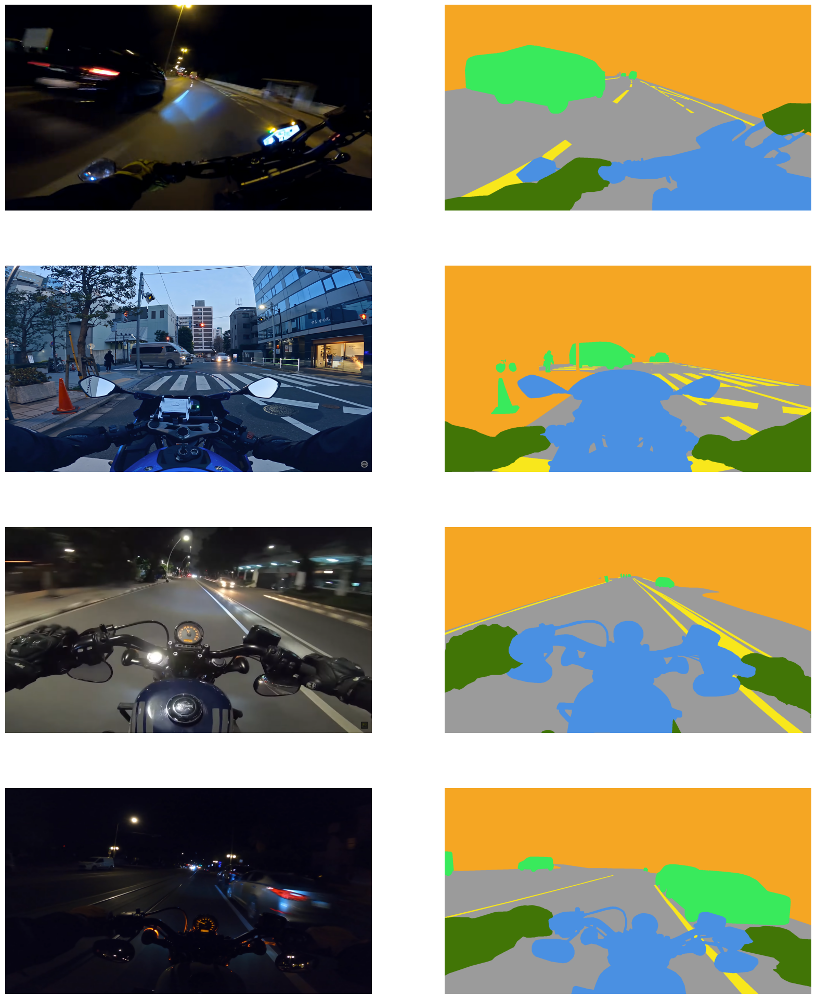

In [4]:
# 데이터 직접 확인
import matplotlib.pyplot as plt
from tensorflow.keras.utils import load_img, img_to_array

plt.figure(figsize=(20,25))
for j in range(4):
    plt.subplot(4,2,2*j+1)
    plt.axis("off")
    plt.imshow(load_img(input_img_paths[j*50]))
    plt.subplot(4,2,2*j+2)
    plt.axis("off")
    plt.imshow(load_img(target_img_paths[j*50]))

In [5]:
# 타겟 데이터의 내부 값 확인
import numpy as np

target = load_img(target_img_paths[0], color_mode='grayscale')
target = img_to_array(target)
target = target.astype("uint8")
color = np.unique(target)
color

array([ 89, 132, 155, 165, 175, 213], dtype=uint8)

####  6개의 영역을 간단하게 정수 딕셔너리로 바꿔준다



In [7]:
dict_color_to_label = dict()
dict_label_to_color = dict()
for i in range(6):
    i = np.uint8(i)
    dict_color_to_label[color[i]] = i
    dict_label_to_color[i] = color[i]
print(dict_color_to_label)

# 이미지 크기 확인
img = load_img(input_img_paths[0])
img.size

{89: 0, 132: 1, 155: 2, 165: 3, 175: 4, 213: 5}


(1920, 1080)

In [8]:

import random

img_size = (272, 480) # 리스케일링 비율은 원본과 최대한 가깝게 유지용
num_imgs = len(input_img_paths)

# 데이터 셔플 및 전처리
random.Random(50).shuffle(input_img_paths)
random.Random(50).shuffle(target_img_paths)

def path_to_input_image(path):
    return img_to_array(load_img(path, target_size=img_size))

def path_to_target(path):
    img = img_to_array(load_img(path, target_size=img_size, color_mode="grayscale"))
    img = img.astype("uint8")
    for val in color:
        img = np.where(img==val, dict_color_to_label[val], img)
    return img

input_imgs = np.zeros((num_imgs,) + img_size + (3,), dtype="float32")
targets = np.zeros((num_imgs,) + img_size + (1,), dtype="uint8")

for i in range(num_imgs):
    input_imgs[i] = path_to_input_image(input_img_paths[i])
    targets[i] = path_to_target(target_img_paths[i])


In [10]:
# 학습, 검증, 테스트 데이터 분할
num_test_samples = 20
num_val_samples = 20
train_input_imgs = input_imgs[:-(num_test_samples + num_val_samples)]
train_targets = targets[:-(num_test_samples + num_val_samples)]
val_input_imgs = input_imgs[-(num_test_samples + num_val_samples):-num_test_samples]
val_targets = targets[-(num_test_samples + num_val_samples):-num_test_samples]
test_input_imgs = input_imgs[-num_test_samples:]
test_targets = targets[-num_test_samples:]

print(len(train_input_imgs))
print(len(train_targets))
print(len(val_input_imgs))
print(len(val_targets))
print(len(test_input_imgs))
print(len(test_targets))

160
160
20
20
20
20


#### 160 20 20 개로 분할

### UNET모델

In [11]:
### 모델 정의 및 학습

# 모델 정의

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Rescaling, Conv2D, MaxPooling2D, UpSampling2D, concatenate

def get_model(img_size, num_classes):

    inputs = Input(shape=img_size + (3,))
    rs = Rescaling(1./255)(inputs)

    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(rs)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)

    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = MaxPooling2D((2, 2))(c3)

    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    c4 = Conv2D(512, (3, 3), activation='relu', padding='same')(c4)
    p4 = MaxPooling2D((2, 2))(c4)

    c5 = Conv2D(1024, (3, 3), activation='relu', padding='same')(p4)
    c5 = Conv2D(1024, (3, 3), activation='relu', padding='same')(c5)

    u6 = UpSampling2D((2, 2))(c5)
    u6 = concatenate([u6, c4])
    c6 = Conv2D(512, (3, 3), activation='relu', padding='same')(u6)
    c6 = Conv2D(512, (3, 3), activation='relu', padding='same')(c6)

    u7 = UpSampling2D((2, 2))(c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(256, (3, 3), activation='relu', padding='same')(u7)
    c7 = Conv2D(256, (3, 3), activation='relu', padding='same')(c7)

    u8 = UpSampling2D((2, 2))(c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(128, (3, 3), activation='relu', padding='same')(u8)
    c8 = Conv2D(128, (3, 3), activation='relu', padding='same')(c8)

    u9 = UpSampling2D((2, 2))(c8)
    u9 = concatenate([u9, c1])
    c9 = Conv2D(64, (3, 3), activation='relu', padding='same')(u9)
    c9 = Conv2D(64, (3, 3), activation='relu', padding='same')(c9)

    outputs = Conv2D(num_classes, 3, activation='softmax', padding='same')(c9)

    model = Model(inputs=inputs, outputs=outputs)

    return model

model = get_model(img_size=img_size, num_classes=6)
model.summary()

from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint

model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])
callbacks = [TensorBoard(log_dir='./log'), ModelCheckpoint("segmentation.h5", save_best_only=True)]
history = model.fit(train_input_imgs, train_targets,
                    epochs=100,
                    callbacks=callbacks,
                    batch_size=16,
                    validation_data=(val_input_imgs, val_targets))


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 272, 480, 3)]        0         []                            
                                                                                                  
 rescaling (Rescaling)       (None, 272, 480, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv2d (Conv2D)             (None, 272, 480, 64)         1792      ['rescaling[0][0]']           
                                                                                                  
 conv2d_1 (Conv2D)           (None, 272, 480, 64)         36928     ['conv2d[0][0]']              
                                                                                              

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


10/10 [==============================] - 101s 3s/step - loss: 13.7981 - accuracy: 0.2958 - val_loss: 1.6497 - val_accuracy: 0.2682
Epoch 2/100
10/10 [==============================] - 17s 2s/step - loss: 1.5646 - accuracy: 0.3656 - val_loss: 1.4340 - val_accuracy: 0.4481
Epoch 3/100
10/10 [==============================] - 17s 2s/step - loss: 1.4479 - accuracy: 0.4225 - val_loss: 1.3901 - val_accuracy: 0.4479
Epoch 4/100
10/10 [==============================] - 18s 2s/step - loss: 1.4149 - accuracy: 0.4227 - val_loss: 1.3663 - val_accuracy: 0.4480
Epoch 5/100
10/10 [==============================] - 17s 2s/step - loss: 1.3842 - accuracy: 0.4227 - val_loss: 1.3480 - val_accuracy: 0.4480
Epoch 6/100
10/10 [==============================] - 16s 2s/step - loss: 1.6562 - accuracy: 0.4253 - val_loss: 1.4748 - val_accuracy: 0.2897
Epoch 7/100
10/10 [==============================] - 16s 2s/step - loss: 1.4523 - accuracy: 0.3446 - val_loss: 1.3626 - val_accuracy: 0.4599
Epoch 8/100
10/10 [====

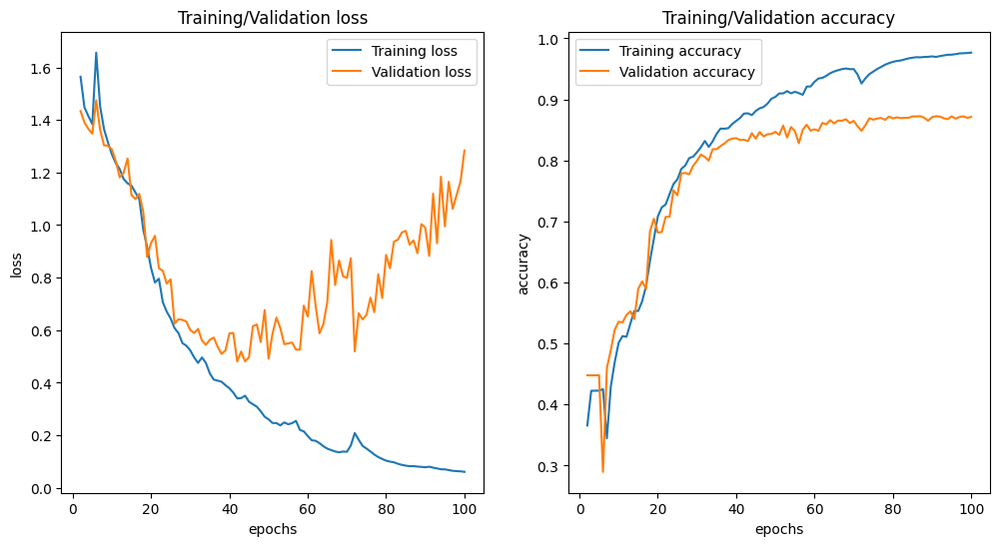

In [12]:
# 결과 시각화

epochs = range(1, len(history.history["loss"]) + 1)[1:]
loss = history.history["loss"][1:]
val_loss = history.history["val_loss"][1:]
acc = history.history["accuracy"][1:]
val_acc = history.history["val_accuracy"][1:]

plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.plot(epochs, loss, label="Training loss")
plt.plot(epochs, val_loss, label="Validation loss")
plt.xlabel("epochs")
plt.ylabel("loss")
plt.title("Training/Validation loss")
plt.legend()

plt.subplot(1,2,2)
plt.plot(epochs, acc, label="Training accuracy")
plt.plot(epochs, val_acc, label="Validation accuracy")
plt.xlabel("epochs")
plt.ylabel("accuracy")
plt.title("Training/Validation accuracy")
plt.legend()

### 에폭 40번 이후 validation loss가 상승한다.. 40번까지만 돌려도 될듯하다.

In [13]:
from tensorflow.keras.models import load_model

model_path = 'segmentation.h5'

loaded_model = load_model(model_path)
loaded_model.evaluate(test_input_imgs, test_targets)

1/1 [==============================] - 28s 28s/step - loss: 0.4159 - accuracy: 0.8543


[0.4159418046474457, 0.8543213605880737]

#### 약 85퍼센트의 정확도를 보인다.

In [4]:
prediction = loaded_model.predict(test_input_imgs)

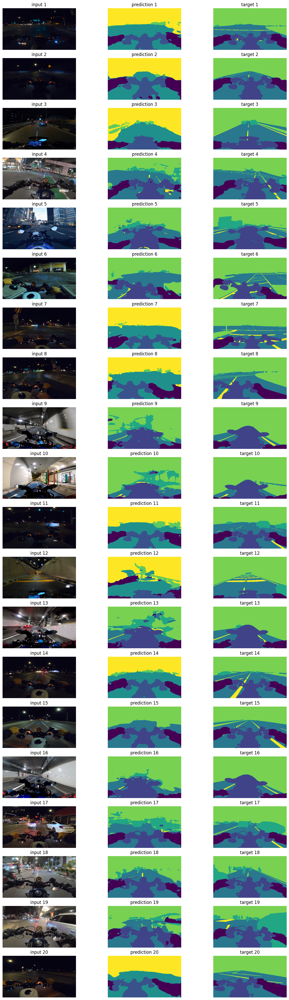

In [16]:
# 모델의 예측 결과 시각화

def convert_output(pred):
    out = np.argmax(pred, axis=-1)
    return out

plt.figure(figsize=(15,50))

for i in range(20):
    plt.subplot(20,3,3*i+1)
    plt.axis('off')
    plt.imshow(test_input_imgs[i]/255)
    plt.title(f'input {i+1}')

    plt.subplot(20,3,3*i+2)
    plt.axis('off')
    output = prediction[i]
    output_img = convert_output(output)
    plt.imshow(output_img)
    plt.title(f'prediction {i+1}')

    plt.subplot(20,3,3*i+3)
    plt.axis('off')
    plt.imshow(test_targets[i])
    plt.title(f'target {i+1}')

#####  
배경색에서의 차이를 보이고 있다 prediction은
노란색으로 인식하고 있음.

특히 배경 영역을 잘 잡아내지 못하는 경우가 많다.탑승 중인 오토바이와 운전자는 대체로 구별을 잘하는 거 같다.

In [ ]:
#!pip install tensorboard
#!pip install pyngrok

In [1]:
%load_ext tensorboard

%tensorboard --logdir './log'


<IPython.core.display.Javascript object>

### 회고
160개의 모델로 그래도 성능이 나쁘진 않다고 생각하는데 이것 외에도 데이터 증강 방법을 시도해 보았는데 코랩이 꺼지고 결과가 좋지 않았다.. 다시 시도 해보아야겠다...